##Mask Detection

© 2023, Zaka AI, Inc. All Rights Reserved.

---
The goal of this project is to build a model that can detect whether a person is wearing a mask or not. You would be downloading the data from kaggle and then building you model while we guide you through the steps.


##Getting the Data

We start by getting the data. The data that we want is on kaggle and you can access it through this link: https://www.kaggle.com/omkargurav/face-mask-dataset What you will have to do, is to search for a way that allows you to download the dataset from kaggle directly into google colab (or your google drive). This process would save you the trouble from downloading the dataset locally and then uploading it to use it in colab.

In [5]:
import shutil

In [6]:
shutil.rmtree("/content/data",ignore_errors=True)
shutil.rmtree("/content/my_data",ignore_errors=True)

In [7]:
#Do your Research
#Test Your Zaka
!mkdir -p ~/.kaggle  #To create a home directory if it doesn't already exist
!cp kaggle.json ~/.kaggle/ #To copy the file "kaggle.json" (i uploaded ) to the directory i just created
!chmod 600 ~/.kaggle/kaggle.json #To be sure that only the file owner has read and write permissions.
!kaggle datasets download -d omkargurav/face-mask-dataset #To download and save the dataset in our current working directory

face-mask-dataset.zip: Skipping, found more recently modified local copy (use --force to force download)


Once the dataset is downloaded, it is going to be zipped, and in order to use it, you need to unzip it. Here you have the option of unzipping it in the environment or in your google drive.

In [8]:
#Test Your Zaka
!unzip face-mask-dataset.zip


Streaming output truncated to the last 5000 lines.
  inflating: data/with_mask/with_mask_3297.jpg  
  inflating: data/with_mask/with_mask_3298.jpg  
  inflating: data/with_mask/with_mask_3299.jpg  
  inflating: data/with_mask/with_mask_33.jpg  
  inflating: data/with_mask/with_mask_330.jpg  
  inflating: data/with_mask/with_mask_3300.jpg  
  inflating: data/with_mask/with_mask_3301.jpg  
  inflating: data/with_mask/with_mask_3302.jpg  
  inflating: data/with_mask/with_mask_3303.jpg  
  inflating: data/with_mask/with_mask_3304.jpg  
  inflating: data/with_mask/with_mask_3305.jpg  
  inflating: data/with_mask/with_mask_3306.jpg  
  inflating: data/with_mask/with_mask_3307.jpg  
  inflating: data/with_mask/with_mask_3308.jpg  
  inflating: data/with_mask/with_mask_3309.jpg  
  inflating: data/with_mask/with_mask_331.jpg  
  inflating: data/with_mask/with_mask_3310.jpg  
  inflating: data/with_mask/with_mask_3311.jpg  
  inflating: data/with_mask/with_mask_3312.jpg  
  inflating: data/with

**At least we can see that we have 3725 data/with_mask , so we can check for it later to be sure that we're not modifying our source directory**

##Importing the Libraries

Now, it is time to import the libraries that we need.

In [9]:
import os
import shutil
import random
import numpy as np
from matplotlib import pyplot as plt
import tensorflow as tf
import cv2

If we look at the data that we extracted, we can see that it is located in 2 folders: with_mask and without_mask. What we need to do now, is to create a hierarchy of folders that would help us specify the training, validation, and testing data. In order to do this you have to use the **os** and the **shutil** libraries that would help you creating folders, and moving images from a folder to another. In simple terms, the libraries helps you perform the same things that you do on your computer with your operating system, but in a programmatic way.

The initial dataset contains a lot of images belonging to the 2 classes, what we will do is randomly sample from this dataset so that we reduce the training and the tuning time.

We need to have in our final directories the following:
* Training: 500 images "with_mask", and 500 images "without_mask"
* Validation: 100 images "with_mask", and 100 images "without_mask"
* Testing: 50 images "with_mask", and 50 images "without_mask"

In [10]:
#Test Your Zaka --- Create the Train, Validation and Testing Folder

source_dir = 'data'
new_dir = 'my_data'
train_dir = os.path.join(new_dir, 'train')
val_dir = os.path.join(new_dir, 'validation')
test_dir = os.path.join(new_dir, 'test')

os.makedirs(new_dir, exist_ok=True)
os.makedirs(train_dir, exist_ok=True)
os.makedirs(val_dir, exist_ok=True)
os.makedirs(test_dir, exist_ok=True)


In [11]:
#Test Your Zaka --- Create the classes folders inside of each folder you created above

classes = ['with_mask', 'without_mask']

# Create the classes folders inside each directory
for class_name in classes:
    os.makedirs(os.path.join(train_dir, class_name), exist_ok=True)
    os.makedirs(os.path.join(val_dir, class_name), exist_ok=True)
    os.makedirs(os.path.join(test_dir, class_name), exist_ok=True)


In [12]:
#Test Your Zaka --- For each class, take the images, and select 500 samples for training and 100 for evaluation, and 50 for testing

train_samples = 500
val_samples = 100
test_samples = 50

# Move the images to the respective directories
for class_name in classes:
    class_dir = os.path.join(source_dir, class_name)
    images = os.listdir(class_dir)
    random.shuffle(images)  #to guarantee a random sampling

    # Move images to the train directory
    for i in range(train_samples):
        image_name = images[i]
        src_path = os.path.join(class_dir, image_name)
        dst_path = os.path.join(train_dir, class_name, image_name)
        shutil.copy(src_path, dst_path)

    # Move images to the validation directory
    for i in range(train_samples, train_samples + val_samples):
        image_name = images[i]
        src_path = os.path.join(class_dir, image_name)
        dst_path = os.path.join(val_dir, class_name, image_name)
        shutil.copy(src_path, dst_path)

    # Move images to the test directory
    for i in range(train_samples + val_samples, train_samples + val_samples + test_samples):
        image_name = images[i]
        src_path = os.path.join(class_dir, image_name)
        dst_path = os.path.join(test_dir, class_name, image_name)
        shutil.copy(src_path, dst_path)


In [13]:
files_in_data_with_mask = os.listdir('/content/data/with_mask')
print(len(files_in_data_with_mask))

files_in_data_without_mask = os.listdir('/content/data/without_mask')
print(len(files_in_data_without_mask))

files_in_my_data_in_test_with_mask = os.listdir('/content/my_data/test/with_mask')
print(len(files_in_my_data_in_test_with_mask))

files_in_my_data_in_train_without_mask = os.listdir('/content/my_data/train/without_mask')
print(len(files_in_my_data_in_train_without_mask))

files_in_my_data_in_validation_with_mask = os.listdir('/content/my_data/validation/with_mask')
print(len(files_in_my_data_in_validation_with_mask))

print('So ,our code indeed is just copying and not modifying anything in our souce directory "data".\n (regarding the 3725)')

3725
3828
50
500
100
So ,our code indeed is just copying and not modifying anything in our souce directory "data".
 (regarding the 3725)


##Inspecting the Dataset

Now we will see some characteristics of our dataset.

Define 3 variables: **training_path**, **validation_path**, and **testing_path** so that you can use them for the rest of the colab.

In [14]:
#Test Your Zaka
training_path = '/content/my_data/train'
validation_path = '/content/my_data/validation'
testing_path  = '/content/my_data/test'

To make sure that everythinh went correctly, write a code that counts the number of images that you have in your training directory for each of the 2 categories: with_mask and without_mask

**I already did it but it's okay** 😆

In [15]:
#Test Your Zaka
tr_0 = os.listdir(os.path.join(training_path,'with_mask'))
print(f'In our training directory : we have {len(tr_0)} images with masks ,')

tr_1 = os.listdir(os.path.join(training_path,'without_mask'))
print(f'                             and {len(tr_1)}  without masks.')

In our training directory : we have 500 images with masks ,
                             and 500  without masks.


Do the same for the validation and the testing folders

In [16]:
#Test Your Zaka
va_0 = os.listdir(os.path.join(validation_path,'with_mask'))
print(f'In our validation directory : we have {len(va_0)} images with masks ,')

va_1 = os.listdir(os.path.join(validation_path,'without_mask'))
print(f'                             and {len(va_1)}  without masks.')

In our validation directory : we have 100 images with masks ,
                             and 100  without masks.


In [17]:
#Test Your Zaka
te_0 = os.listdir(os.path.join(testing_path,'with_mask'))
print(f'In our testing directory : we have {len(te_0)} images with masks ,')

te_1 = os.listdir(os.path.join(testing_path,'without_mask'))
print(f'                             and {len(te_1)}  without masks.')

In our testing directory : we have 50 images with masks ,
                             and 50  without masks.


Write a code that shows 5 random images for people with mask from your training set.

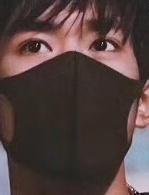

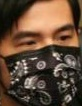

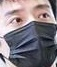

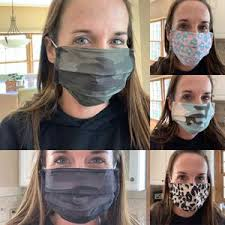

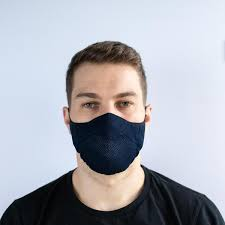

In [18]:
#Test Your Zaka
from google.colab.patches import cv2_imshow

random_images_0 = random.sample(tr_0 , 5)

for img_path in random_images_0:
    img = cv2.imread(os.path.join(training_path,'with_mask',img_path))
    cv2_imshow(img)


Do the same for people without mask.

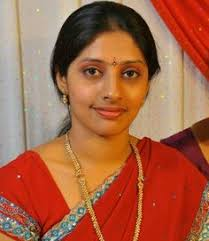

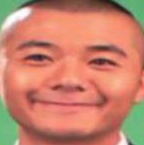

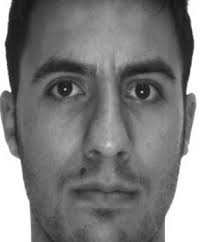

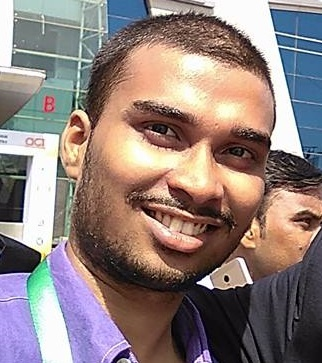

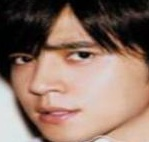

In [19]:
#Test Your Zaka
random_images_1 = random.sample(tr_1 , 5)

for img_path in random_images_1:
    img = cv2.imread(os.path.join(training_path,'without_mask',img_path))
    cv2_imshow(img)

##Modeling

Define a model structure that can deal with the images that we have to classify them between the 2 classes.

In [20]:
#Test Your Zaka
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Flatten, Dense ,AveragePooling2D

# Define the target image size and the number of classes
target_size = (245, 205)

# Define the model
def create_model():

  model = Sequential()

  model.add(Conv2D(20, (3, 3), activation='relu', input_shape=(target_size[0], target_size[1], 3), padding='same'))
  model.add(AveragePooling2D())
  model.add(Conv2D(24, (3, 3), activation='relu', padding='same'))
  model.add(AveragePooling2D())
  model.add(Conv2D(28, (3, 3), activation='relu', padding='same'))
  model.add(AveragePooling2D())

  model.add(Flatten())
  model.add(Dense(55, activation='relu'))
  model.add(Dense(1, activation='sigmoid'))

  model.compile(optimizer='adam', loss='binary_crossentropy', metrics=['accuracy', 'AUC' ,tf.keras.metrics.Precision(), tf.keras.metrics.Recall()])

  return model

Train the model that you defined on the training data and evaluate it on the validation data. Feel free to tune the hyperparameters of your model until you reach a satisfying result on the validation set. </br>
**N.B:** Make sure to save the model training history in a variable to plot later the learning curve.

In [21]:
#Test Your Zaka
from tensorflow.keras.preprocessing.image import ImageDataGenerator


# Create an instance of ImageDataGenerator
datagen = ImageDataGenerator(rescale=1./255)

# Create the train and validation generators
train_generator = datagen.flow_from_directory(
    'my_data/train',
    target_size=(245, 205),
    batch_size=65,
    class_mode='binary',
    shuffle=True
)

val_generator = datagen.flow_from_directory(
    'my_data/validation',
    target_size=(245, 205),
    batch_size=20,
    class_mode='binary',
    shuffle=False
)

model = create_model()
history = model.fit(train_generator , epochs=10 , validation_data=val_generator)

Found 1000 images belonging to 2 classes.
Found 200 images belonging to 2 classes.
Epoch 1/10
16/16 [==============================] - 18s 383ms/step - loss: 0.6214 - accuracy: 0.6360 - auc: 0.6968 - precision: 0.6269 - recall: 0.6720 - val_loss: 0.4519 - val_accuracy: 0.7900 - val_auc: 0.9101 - val_precision: 0.9394 - val_recall: 0.6200
Epoch 2/10
16/16 [==============================] - 5s 326ms/step - loss: 0.3597 - accuracy: 0.8530 - auc: 0.9200 - precision: 0.8700 - recall: 0.8300 - val_loss: 0.2807 - val_accuracy: 0.8800 - val_auc: 0.9574 - val_precision: 0.8725 - val_recall: 0.8900
Epoch 3/10
16/16 [==============================] - 5s 279ms/step - loss: 0.2746 - accuracy: 0.8870 - auc: 0.9540 - precision: 0.8990 - recall: 0.8720 - val_loss: 0.2376 - val_accuracy: 0.9000 - val_auc: 0.9667 - val_precision: 0.8922 - val_recall: 0.9100
Epoch 4/10
16/16 [==============================] - 5s 340ms/step - loss: 0.2251 - accuracy: 0.9030 - auc: 0.9693 - precision: 0.9087 - recall: 0.89

Plot the accuracy curve and see if your model is overfit.

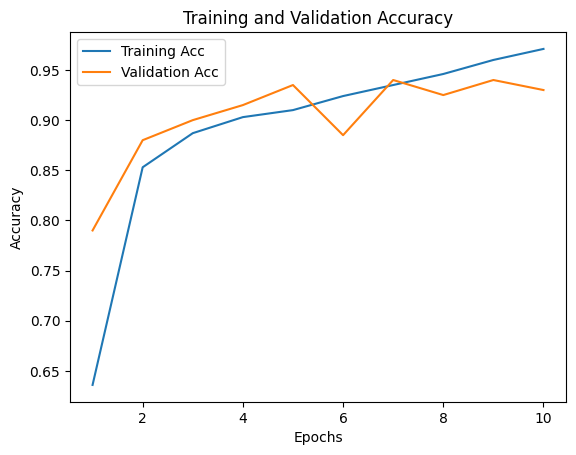

In [22]:
#Test Your Zaka
# Access the training history
train_acc = history.history['accuracy']
val_acc = history.history['val_accuracy']

# Plot the accuracy curve
epochs = range(1, len(train_acc) + 1)

plt.plot(epochs, train_acc, label='Training Acc')
plt.plot(epochs, val_acc, label='Validation Acc')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()


[Share your Zaka]

**The training accuracy keep learning and increasing , while the validation accuracy is struggling from a lot of fluctuations preventing it from increasing equaly with the training acc ... which where we conclude the overfitting in our model that needs to be less sensitive while training and more capable to handle variations on an unseen data(we need bigger dataset for training)**

##Evaluate the model


Now you will evaluate the model that you built on the testing set that you kept aside since the beginning.

In [24]:
#Test Your Zaka
test_generator = datagen.flow_from_directory(
    'my_data/test',
    target_size=(245, 205),
    batch_size=30,
    class_mode='binary',
    shuffle=False
)

test_results = model.evaluate(test_generator)


Found 100 images belonging to 2 classes.
4/4 [==============================] - 1s 69ms/step - loss: 0.2172 - accuracy: 0.9000 - auc: 0.9786 - precision: 0.8571 - recall: 0.9600


Now we want to visualize the confusion matrix in order to see how much our classifier is good in predicting different classes.

4/4 [==============================] - 0s 58ms/step


<Axes: >

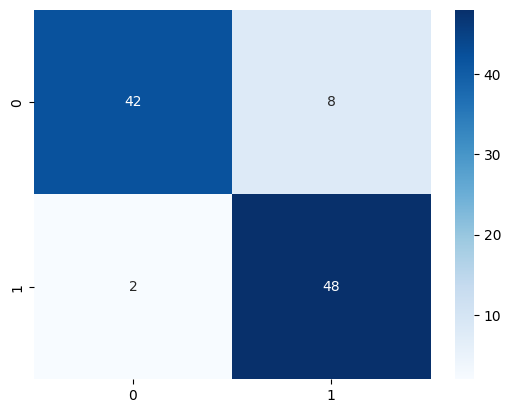

In [25]:
#Test Your Zaka
import numpy as np
from sklearn.metrics import confusion_matrix
import seaborn as sns

y_pred = model.predict(test_generator)
y_predictions = np.where(y_pred > 0.5, 1, 0)
true_labels = test_generator.labels

cm = confusion_matrix(true_labels,y_predictions)
sns.heatmap(cm, annot=True, fmt='d', cmap='Blues')


**What did you learn about your model from this confusion matrix?**

[Share Your Zaka]

**we have the total predicted positive =8+48=56 which is greater than the real positives =2+48=50 ,which is why our val_recall > val_precision .So our model often predicts the positive class (with_mask) ---> predicting people as wearing masks while they actually don't**

***NB* : u may see another numbers in a different execution bcz of the randomness process while splitting our train , test and validation data**

##Error Analysis

Now we need to see for each of the images that we have in our testing set, what did the model predict. This helps us analyze the errors and try to think why the model predicted some things in the wrong way.

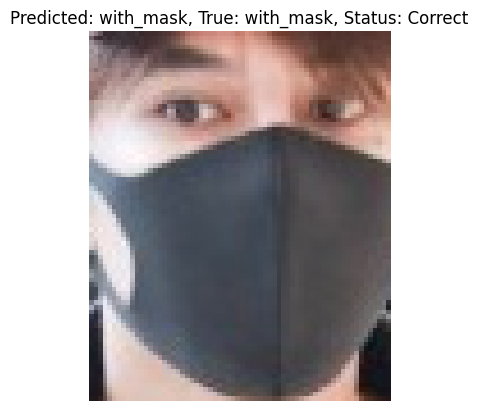

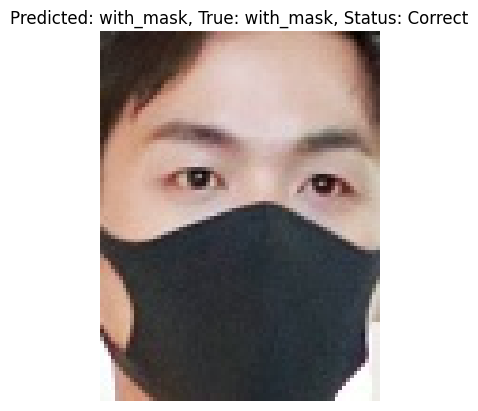

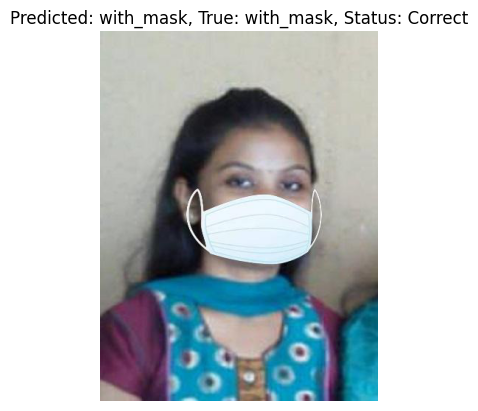

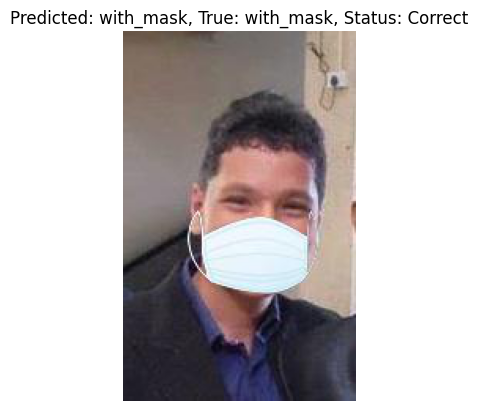

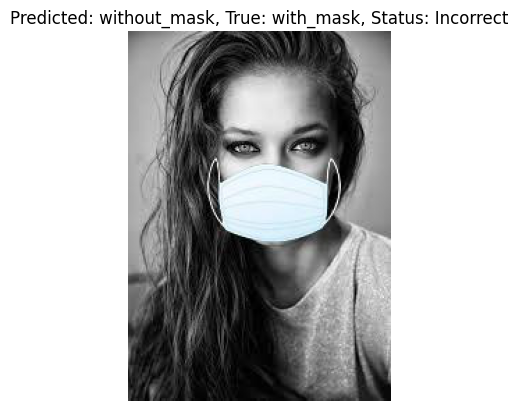

...

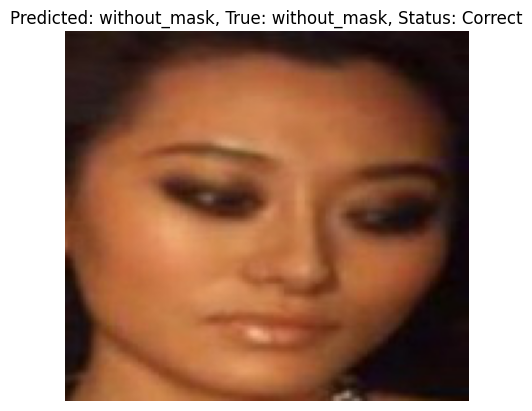

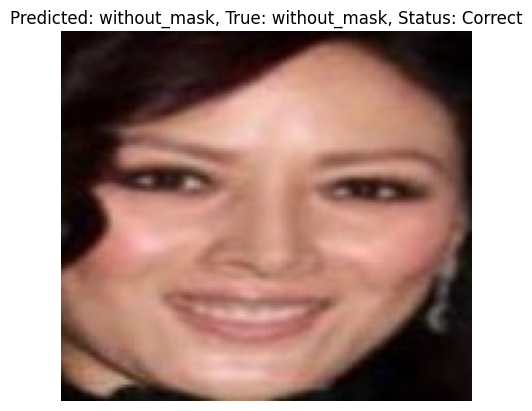

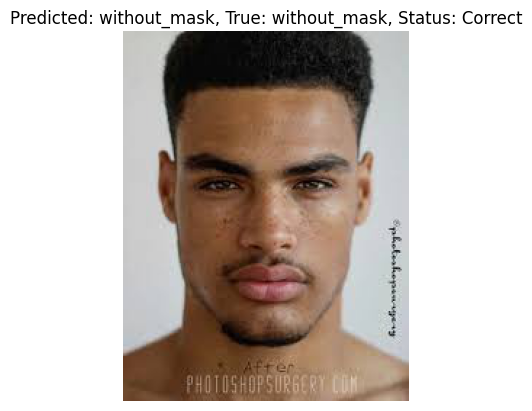

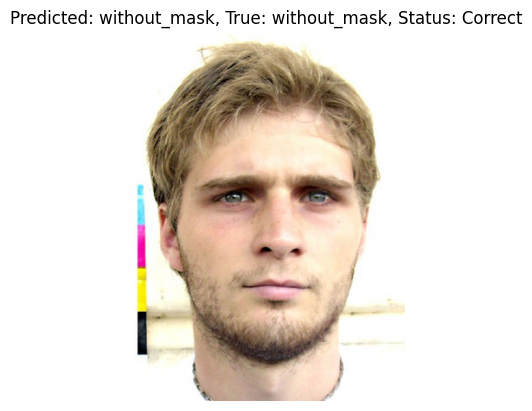

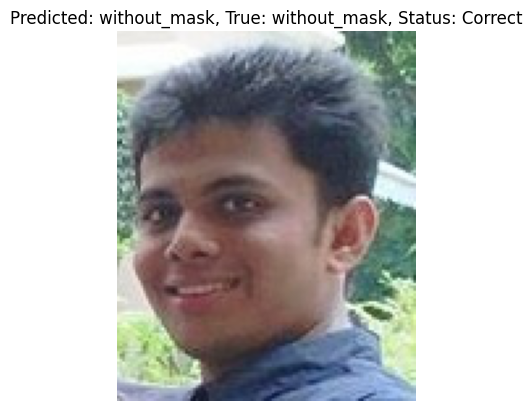

In [26]:
#Test Your Zaka

test_filenames = test_generator.filenames
true_labels = test_generator.classes

for i in range(len(test_filenames)):
    image_path = os.path.join(testing_path, test_filenames[i])
    image = plt.imread(image_path)

    predicted_label = int(y_predictions[i])
    true_label = int(true_labels[i])

    class_names = list(test_generator.class_indices.keys())

    # Check if the prediction is correct or not
    if predicted_label == true_label:
        status = "Correct"
    else:
        status = "Incorrect"

    # Display the image and prediction
    plt.imshow(image)
    plt.axis('off')
    plt.title(f"Predicted: {class_names[predicted_label]}, True: {class_names[true_label]}, Status: {status}")
    plt.show()



Try to derive some conclusions from the wrong predictions that your model has made. Meaning: why do you think these predictions were wrong?

[Share Your Zaka]

**We can notice some common and related things among the incorrectly predicted images like persons who have mask by photoshop and missing the right position for it and men with long beard .
So we may conclude that wrong position for masks (different pixels localisation) are a very common cause for model inaccuracy**

Think of a way that you can use in order to improve the performance of your model, and implement it

[Share Your Zaka]

**We can do some image augmentation like shifts, flips, rotations and zooming so that we ensure our model is going to predict the mask presence even though it's slightly misplaced + we can add a dropout layer to help regularize too**


In [57]:

#Data Augmentation
datagen1 = ImageDataGenerator(
    rescale=1./255,
    rotation_range=40,
    width_shift_range=0.2,
    height_shift_range=0.2,
    zoom_range=[0.2 , 1.2],
    horizontal_flip=True,
)

train_generator1 = datagen1.flow_from_directory(
    training_path,
    target_size=target_size,
    batch_size=65,
    class_mode='binary',
    shuffle=True

)

val_generator1 = datagen1.flow_from_directory(
    validation_path,
    target_size=target_size,
    batch_size= 20,
    class_mode='binary',
    shuffle=False
)

model1 = create_model()
history1 = model1.fit(train_generator1, epochs=10,validation_data=val_generator1)


Found 1000 images belonging to 2 classes.
Found 200 images belonging to 2 classes.
Epoch 1/10
16/16 [==============================] - 18s 974ms/step - loss: 0.6909 - accuracy: 0.6010 - auc: 0.6353 - precision_15: 0.6033 - recall_15: 0.5900 - val_loss: 0.5556 - val_accuracy: 0.7600 - val_auc: 0.8321 - val_precision_15: 0.8095 - val_recall_15: 0.6800
Epoch 2/10
16/16 [==============================] - 15s 968ms/step - loss: 0.5092 - accuracy: 0.7720 - auc: 0.8353 - precision_15: 0.7787 - recall_15: 0.7600 - val_loss: 0.4675 - val_accuracy: 0.7750 - val_auc: 0.8595 - val_precision_15: 0.7723 - val_recall_15: 0.7800
Epoch 3/10
16/16 [==============================] - 15s 966ms/step - loss: 0.4874 - accuracy: 0.7670 - auc: 0.8475 - precision_15: 0.7665 - recall_15: 0.7680 - val_loss: 0.4641 - val_accuracy: 0.8050 - val_auc: 0.8623 - val_precision_15: 0.8020 - val_recall_15: 0.8100
Epoch 4/10
16/16 [==============================] - 16s 1s/step - loss: 0.4996 - accuracy: 0.7610 - auc: 0.838

Found 100 images belonging to 2 classes.
7/7 [==============================] - 0s 46ms/step


<Axes: >

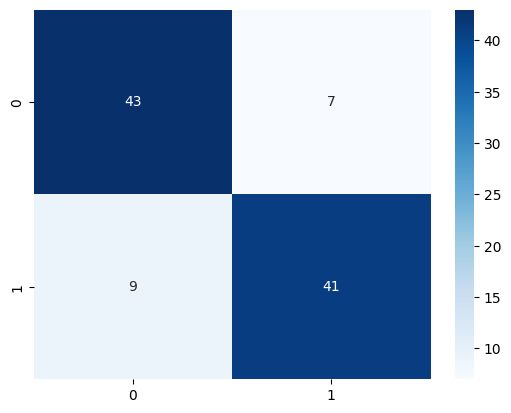

In [58]:
test_generator1 = datagen.flow_from_directory(
    'my_data/test',
    target_size=(245, 205),
    batch_size=15,
    class_mode='binary',
    shuffle=False
)

test_results1 = model1.evaluate(test_generator1)

y_pred1 = model1.predict(test_generator1)
y_predictions1 = np.where(y_pred1 > 0.5, 1, 0)
true_labels1 = test_generator1.classes

cm1 = confusion_matrix(true_labels1,y_predictions1)
sns.heatmap(cm1, annot=True, fmt='d', cmap='Blues')


Now we can see how image augmentation can indeed improve our model's performance --->  val_recall ~ val_precision . which means our model is no longer preferring the positive target class.  

**Your Friend took your code and ran it again, but obtained different accuracies on the different sets. How do you interpret this?**

[Share Your Zaka]

**Actually it's expected since our model depends on random splitting for the train , test , validation datasets and even the shuffling process (when we were iterating over the images randomly to fill our new directory) .Which give different observations in every execution for the model , so different learning ---> another pattern ---> another results including different metrics (even though they're not too much different )**